# Evaluate model.

This notebook is used after the training procedure, to inspect the training summary and test the model on the test set or training set.

In [1]:
cd("..")
using Pkg
Pkg.activate(".")
base_dir = pwd()

  Activating project at `/mnt/NGI_disks/ebr/P/2022/01/20220127/Calculations/AP3/models/tsunami-inundation-emulator`


"/mnt/NGI_disks/ebr/P/2022/01/20220127/Calculations/AP3/models/tsunami-inundation-emulator"

In [2]:
using NCDatasets, Flux, CUDA, Plots, DelimitedFiles, Distributed, DataFrames, CSV, Serialization, JSON
using Dates: format, now
using Statistics, Random, StatsPlots, StatsBase, Measures
import YAML
using BSON: @save, @load

gr()
theme(:ggplot2)

In [3]:
# Set model folder to working directory
rundir = "/home/ebr/projects/tsunami-inundation-emulator/article_runs/t591/mc8_l8_rel/"  
cd(rundir)
pwd()

"/mnt/NGI_disks/ebr/P/2022/01/20220127/Calculations/AP3/models/tsunami-inundation-emulator/article_runs/t591/mc8_l8_rel"

In [4]:
include("datareader.jl")
eval_dir = joinpath("evaluation", "BS_events")
config = DataReader.parse_config("config.yml")
reader = DataReader.Reader(config)

Main.DataReader.Reader("/data_large/stg/UMA_download/", "/data_large/grids/Catania/C_CT.grd", 10, (1:912, 1:2224), (30:45, 1:480), (1, 1), (912, 2224), Float32[15.0376 14.4699 … 155.852 155.748; 14.2821 14.2657 … 155.779 155.678; … ; -2.79932 -3.02242 … -66.2616 -66.3188; -2.82395 -3.04324 … -66.4558 -66.5128], true)

In [5]:
# Create evaluation directory
if !isdir(eval_dir)
    mkpath(eval_dir)
end

In [6]:
# Read mask
ct_mask = BitArray(readdlm("ct_mask.txt", '\t',Bool, '\n'));
aspect_ratio = config["scale"][1]/config["scale"][2] # Pixel shape.

1.0

In [7]:
# To load the model.
#@load joinpath(rundir,"$(config["model_name"]).bson") model
include("model_config.jl")
model = ModelConfig.load("$(config["model_name"]).jls")
Flux.reset!(model)

[ Info: Loads model from file: mc8_l8.jls


In [8]:
model

Chain(
  Chain(
    Conv((3, 3), 1 => 8, leakyrelu, bias=false),  # 72 parameters
    MaxPool((3, 3), stride=(1, 2)),
    Conv((3, 5), 8 => 16, leakyrelu, bias=false),  # 1_920 parameters
    MaxPool((3, 5), stride=(2, 3)),
    Conv((3, 5), 16 => 32, leakyrelu, pad=1, bias=false),  # 7_680 parameters
    MaxPool((3, 5), stride=(2, 3)),
    Conv((1, 1), 32 => 32, leakyrelu),  # 1_056 parameters
    Flux.flatten,
    Dropout(0.5),
    Dense(768 => 8, leakyrelu),         # 6_152 parameters
  ),
  Chain(
    Dense(8 => 64, leakyrelu),          # 576 parameters
    Dense(64 => 418908, leakyrelu),     # 27_229_020 parameters
  ),
)                   # Total: 11 arrays, 27_246_476 parameters, 103.940 MiB.

## Training loss

In [9]:
train_summary = CSV.File(joinpath(rundir, "train-summary.txt"); delim='\t') |> DataFrame

,epoch,batch,processed_scenarios,train_loss,test_loss
,Float64,Float64,Float64,Float64,Float64
1,1.0,1.0,10.0,0.253578,0.131336
2,1.0,11.0,110.0,0.461965,0.104337
3,1.0,21.0,210.0,0.199115,0.0724925
4,1.0,31.0,310.0,0.164492,0.0488364
5,1.0,41.0,410.0,0.120605,0.0170002
6,1.0,51.0,510.0,0.114929,0.0420475
7,2.0,61.0,610.0,0.0663611,0.052583
8,2.0,71.0,710.0,0.0339011,0.0390715
9,2.0,81.0,810.0,0.0779147,0.00543822


In [10]:
theme(:default)
step = 1
# The script writes to file every 10-batch.
weight_updates = [i*10 for i in 1:length(train_summary[!,:train_loss])][1:step:end]

p = plot(
    weight_updates,
    train_summary.test_loss[1:step:end], 
    alpha=0.6, 
    xlabel="Number of weight updates", 
    ylabel="Batch loss", 
    label="test",
    yaxis=:log,
    grid=true,
    linealpha = 0.5,
    linewidth = 0.5,
    marker=:circle,
    markersize=2,
    markerstrokewidth=0.5,
    dpi=300
)
plot!(
    p,
    weight_updates,
    train_summary.train_loss[1:step:end], 
    alpha=0.8,  
    label="train",
    #linestyle=:auto,
    marker=:diamond,
    markerstrokewidth = 0.8,
    markersize = 2,
    linewidth = 0.5
)
savefig(p, joinpath(eval_dir, "train_summary.png"))
display(p)

# Making predictions.

Before the analysis we need to make predictions. These are both evaluation on selected points, and average values.

The proceedure has been implemented in the script `make-model-summary.jl`. 

In [11]:
# Copy scripts for training to rundir. Next run the script 
#cp(joinpath(base_dir,"test_points.txt"), "test_points.txt", force=true)
#cp(joinpath(base_dir, "scripts/make-model-summary.jl"), "make-model-summary.jl", force=true)

The script should be run from the model run directory.

```terminal
julia --project make-model-summary.jl --scenarios [train/test/path to file]
```

In [12]:
# Create mask for test points from file test_points.txt
selected_mask = falses(size(ct_mask))

poi_df = CSV.File(joinpath(rundir, "test_points.txt"); delim='\t') |> DataFrame;
for df_row in eachrow(poi_df)
    #println("point_nr: $(df_row.point_nr), row: $(df_row.row), col: $(df_row.col)")
    selected_mask[df_row.row, df_row.col] = true
end

In [13]:
theme(:default)
heatmap(
    DataReader.downsample(reader, reader.topography)', 
    aspect_ratio=1/aspect_ratio, 
    size=(600, 1400), 
    c=:oleron, 
    clims = (-30,30), 
    margin=5mm,
    grid=false,
    showaxis = true,
    ticks = true,
    
)
p = @df poi_df scatter!(:row, :col, marker = (15, 0.3, :orange), label=false)
@df poi_df annotate!(p, :row, :col, [text("$i", 8, :center) for i in :point_nr])
savefig(joinpath(eval_dir, "poi.png"))
display(p)

# Summary statistics

In [14]:
# Load output as dataframe.
eval_df = CSV.File(joinpath(eval_dir, "summary_results.txt"); delim='\t') |> DataFrame;
unique!(eval_df, :scenario)
# sort!(test_df, [:error]);

In [15]:
names(eval_df)

5-element Vector{String}:
 "scenario"
 "l2_err"
 "l1_err"
 "l2_norm"
 "l1_norm"

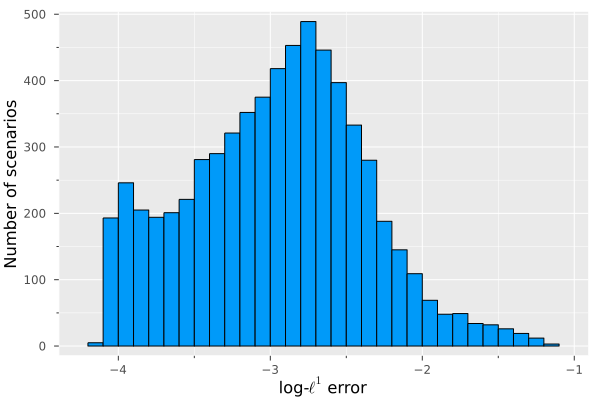

In [16]:
theme(:ggplot2)
h = histogram(log10.(eval_df.l1_err), label= "", xlabel = "log-\$\\ell^1\$ error", ylabel="Number of scenarios")
savefig(h, joinpath(eval_dir, "mean_error_hist.png"))
display(h)

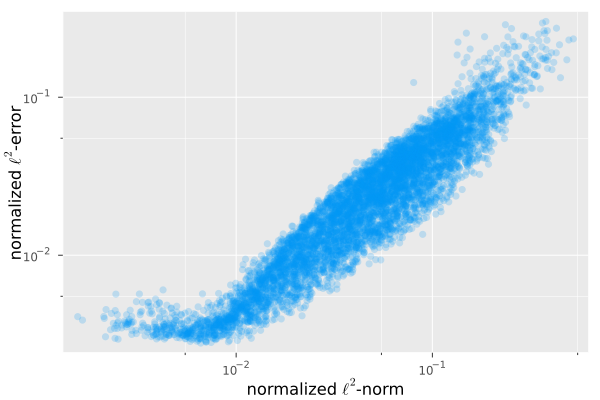

In [17]:
theme(:ggplot2)
p = scatter(eval_df.l2_norm, eval_df.l2_err, scale = :log10, xlabel="normalized \$\\ell^2\$-norm", ylabel="normalized \$\\ell^2\$-error", label = "", alpha=0.2)
savefig(p, joinpath(eval_dir, "norm_error.png"))
display(p)

In [18]:
eval_df[!, "rel_error"] = eval_df.l1_err./eval_df.l1_norm;

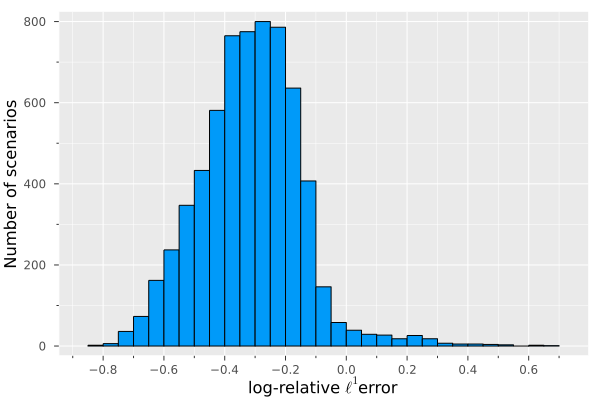

In [19]:
theme(:ggplot2)
h = histogram(log10.(eval_df.rel_error), label = "", xlabel="log-relative \$\\ell^1\$error", ylabel="Number of scenarios")
savefig(h, joinpath(eval_dir, "rel_error_hist.png"))
display(h)

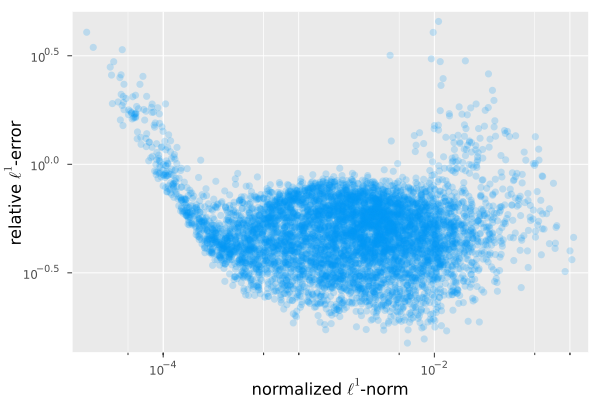

In [20]:
theme(:ggplot2)
p = scatter(eval_df.l1_norm, 
            eval_df.rel_error, 
            scale = :log10, 
            xlabel="normalized \$\\ell^1\$-norm", 
            ylabel="relative \$\\ell^1\$-error", 
            label = "", alpha=0.2)

savefig(p, joinpath(eval_dir, "rel_error_norm.png"))
display(p)

Note that this loss is by scenario, and not averaged over the batch, which is the case for the summary loss. 
However, while the batch loss of the summary is rather symmetric, this distribution is almost bimodal.
Is this due to a skew training set?
The above figure of error against norm indicates that it is not likely that size of the inundation is a good separator. 
Are there other classes that could explain the difference? 
Say, direction of the wave, or if its a crest or a through that approaches first.

Let us inspect some of the predictions.

# Plotting predictions

In [21]:
sort!(eval_df, [:l1_err]) # sort according to relative error.
#p = plot(log10.(eval_df.accuracy), xlabel = "Scenarios ordered by relative error", ylabel = "log-accuracy")

,scenario
,String
1,7_BS_1474/0102_E01267N3753E01646N3535-BS-M650_E01551N3692_D041_S202D10R270_A000178_S012
2,5_BS_1474/0700_E01470N3877E01631N3641-BS-M650_E01555N3715_D010_S157D10R270_A000318_S006
3,6_BS_1474/0604_E01267N3753E01646N3535-BS-M650_E01551N3692_D010_S022D30R270_A000178_S012
4,9_BS_1474/1114_E01964N3926E02184N3685-BS-M707_E02027N3805_D010_S157D30R270_A001194_S013
5,BS_1474/0912_E01267N3753E01646N3535-BS-M650_E01551N3692_D010_S202D50R270_A000178_S012
6,2_BS_1474/1027_E01267N3753E01646N3535-BS-M650_E01551N3692_D010_S202D30R270_A000178_S012
7,9_BS_1474/0925_E01598N4052E01840N3892-BS-M707_E01764N3917_D010_S067D50R090_A001194_S013
8,5_BS_1474/0096_E01267N3753E01646N3535-BS-M650_E01551N3692_D041_S202D30R270_A000178_S012
9,4_BS_1474/0829_E01267N3753E01646N3535-BS-M650_E01551N3692_D072_S202D10R270_A000178_S012


In [22]:
function get_prediction(scenario)
    x, eta, deformed_topography = reader(scenario) # Reads scenario.

    # Make prediction.
    eta = reshape(eta, (length(config["ts_slice"][1]), length(config["ts_slice"][2]),1,1))
    hat_x = zeros(Float32, config["dims"]...);
    
    Flux.reset!(model)
    hat_x[ct_mask] = relu(model(eta) - deformed_topography[ct_mask]);

    return x, hat_x
end

get_prediction (generic function with 1 method)

In [23]:
# Create plot of each case
top_margin = -10mm
margin = 0mm
bottom_margin = -10mm

function compare_maps(target, prediction)
    clim = (0,max(maximum(target),maximum(prediction)))
    p1 = heatmap(
        target'; 
        c=:grayC,
        clim=clim, 
        aspect_ratio=1/aspect_ratio, 
        margin=margin, 
        top_margin = top_margin,
        bottom_margin = bottom_margin,
        grid=false,
        showaxis = false,
        ticks = false,
        xlabel = "Target"
    )
    p2 = heatmap(
        prediction', 
        clim=clim,
        c=:grayC,
        aspect_ratio=1/aspect_ratio, 
        margin=margin, 
        top_margin = top_margin,
        bottom_margin = bottom_margin,
        grid=false,
        showaxis = false,
        ticks = false,
        xlabel = "Prediction"
    )
    p3 = heatmap(
        target'-prediction', 
    #    c = cgrad(:RdBu, rev = false),
         c = cgrad([:darkblue,:white,:darkred], 9, categorical = true),
    #    c = :vik,
        clims = (-1, 1) .* maximum(abs, target-prediction), 
        aspect_ratio=1/aspect_ratio, 
        margin=margin, 
        top_margin = top_margin,
        bottom_margin = bottom_margin,
        grid=false,
        showaxis = false,
        ticks = false,
        xlabel = "Target - Prediction"
    )
    p = plot(
        p1, p2, p3, 
        layout = (1,3), 
        size=(1000,600),
        dpi=300
        #title=["Target" "Prediction" "Target-Prediction"], 
        #titleloc= :center
    )
    return(p)
end

compare_maps (generic function with 1 method)

### Best in terms of $\ell^1$-error.

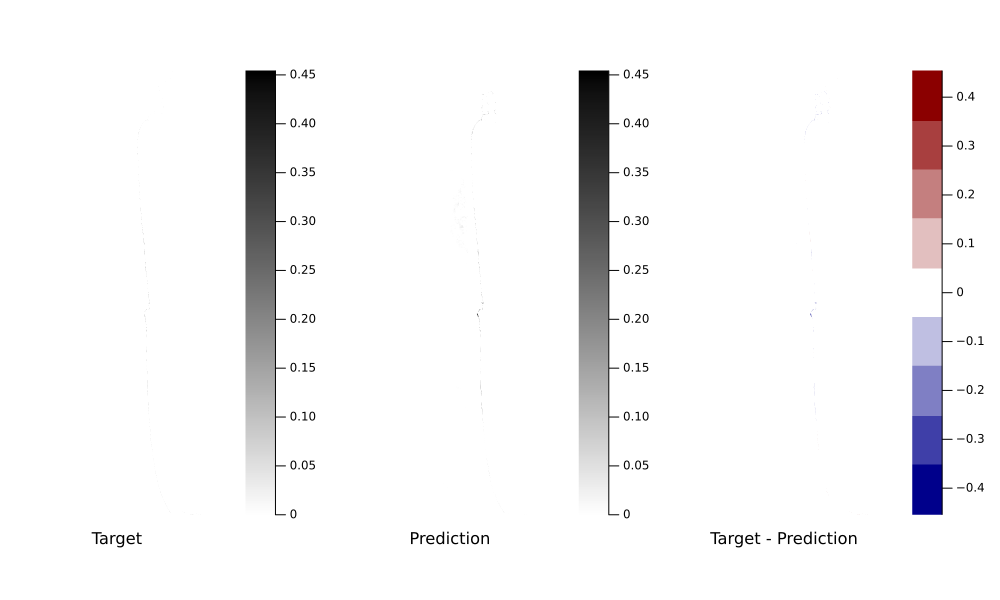

In [24]:
#theme(:ggplot2)
theme(:default)
p = compare_maps(get_prediction(eval_df.scenario[1])...)

savefig(p, joinpath(eval_dir, "inundation_best_err.png"))
display(p)

median 

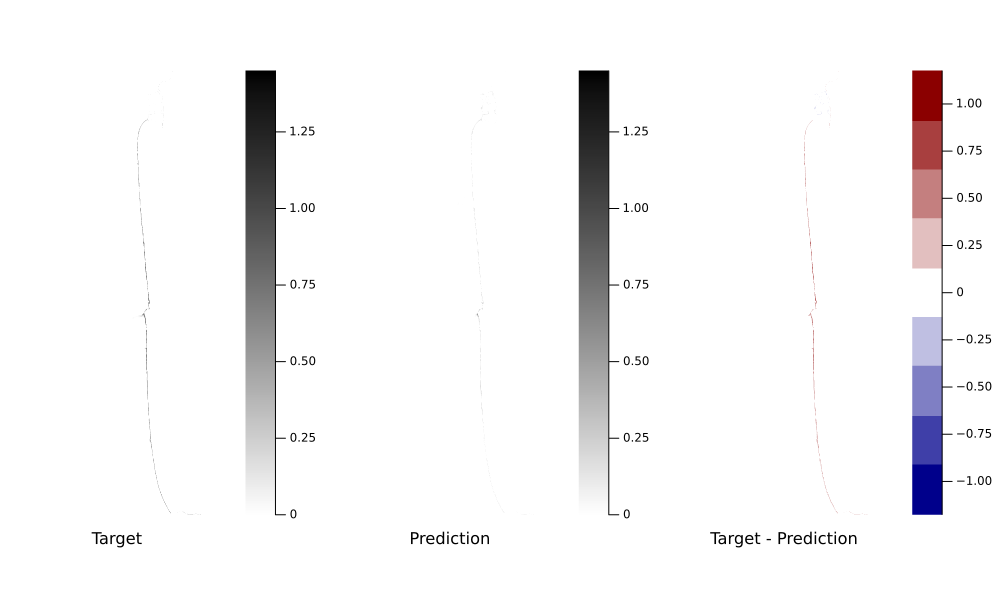

In [25]:
median_scenario = eval_df.scenario[eval_df.l1_err .< quantile(eval_df.l1_err, 0.5)][end]
p = compare_maps(get_prediction(median_scenario)...)
savefig(p, joinpath(eval_dir, "inundation_median_l1_err.png"))
display(p)


### Worst

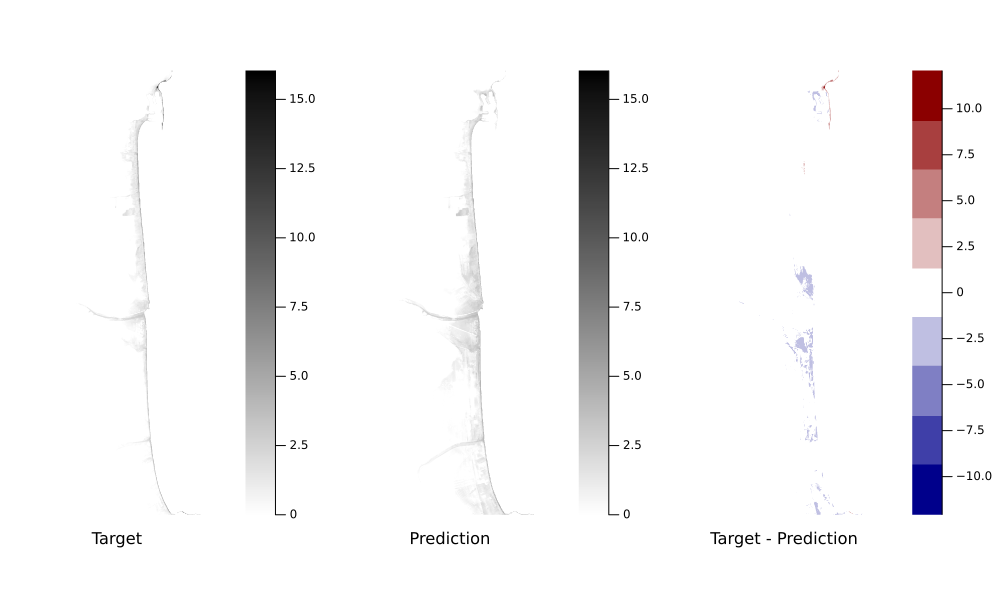

In [26]:
p = compare_maps(get_prediction(eval_df.scenario[end])...)
savefig(p, joinpath(eval_dir, "inundation_worst_l1_error.png"))
display(p)

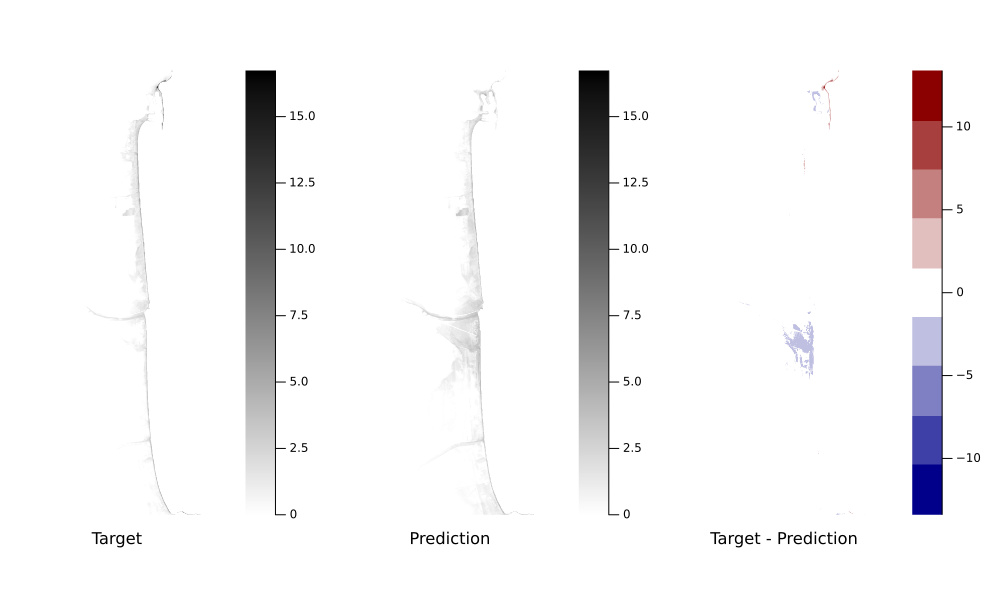

In [27]:
compare_maps(get_prediction(eval_df.scenario[end-1])...)

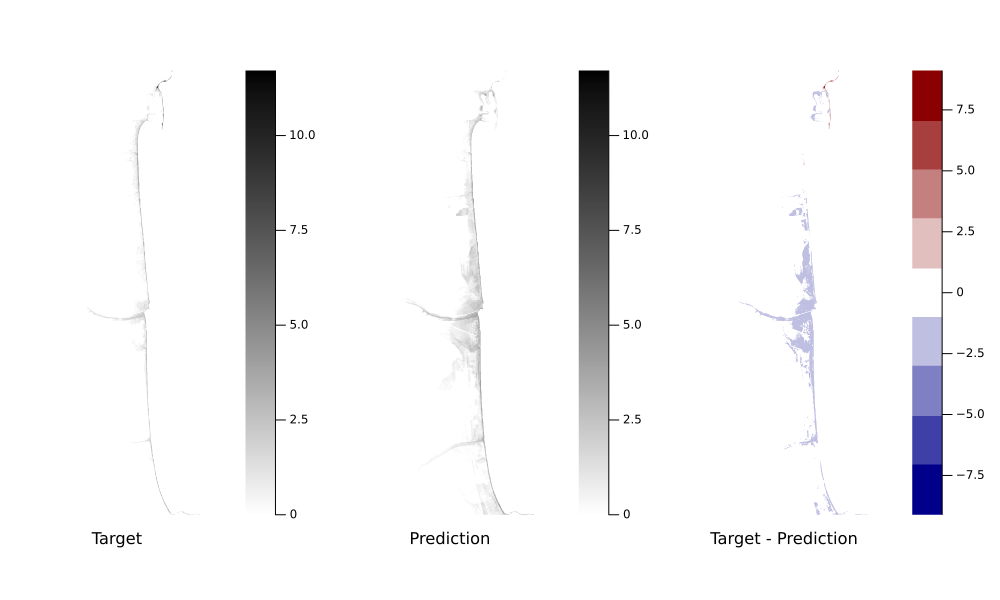

In [28]:
compare_maps(get_prediction(eval_df.scenario[end-2])...)

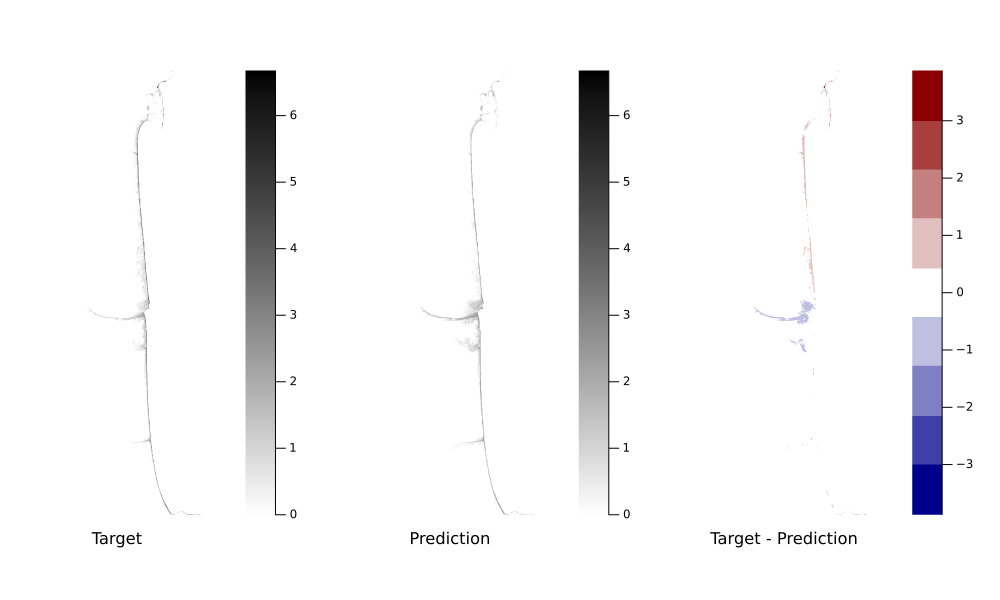

In [29]:
q_scenario = eval_df.scenario[eval_df.l1_err .< quantile(eval_df.l1_err, 0.95)][end]
p = compare_maps(get_prediction(q_scenario)...)
savefig(p, joinpath(eval_dir, "inundation_95quantile_l1_err.png"))
display(p)

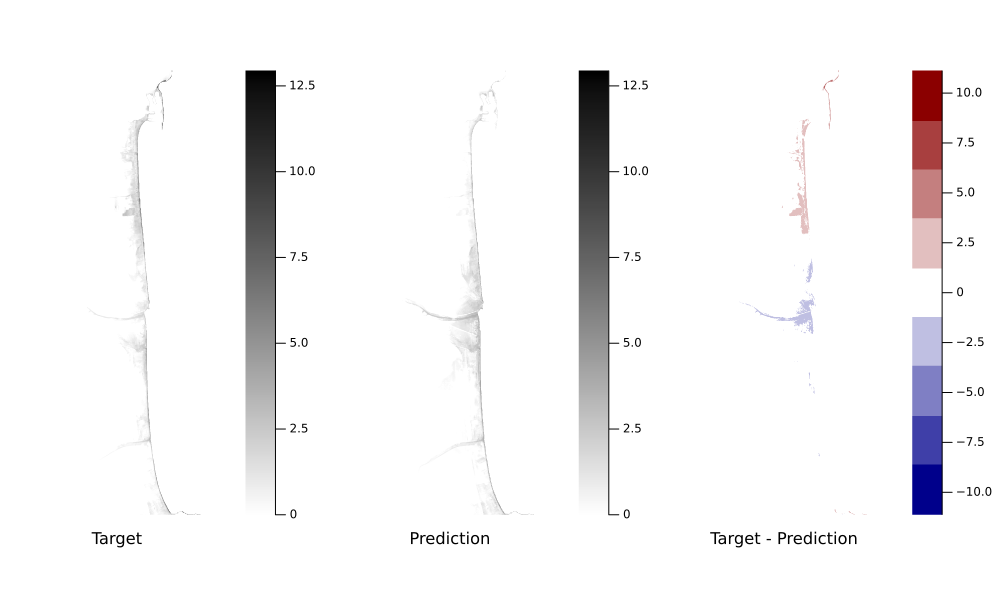

In [30]:
q_scenario = eval_df.scenario[eval_df.l1_err .< quantile(eval_df.l1_err, 0.999)][end]
p = compare_maps(get_prediction(q_scenario)...)
savefig(p, joinpath(eval_dir, "inundation_999quantile_l1_err.png"))
display(p)

### Large inundations

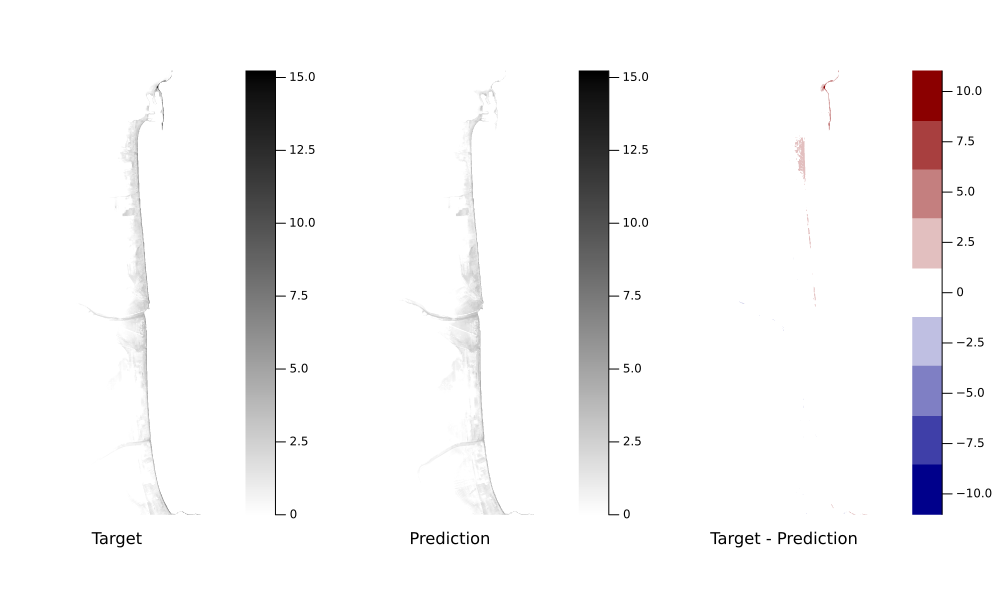

In [31]:
sort!(eval_df, [:l1_norm])
p = compare_maps(get_prediction(eval_df.scenario[end])...)
savefig(p, joinpath(eval_dir, "inundation_large_1.png"))
display(p)

In [32]:
theme(:default)

function show_map_on_size_error(scenario)
    bottom_margin = -10mm
   
    p1 = scatter(
            eval_df.l2_norm, 
            eval_df.l2_err, 
            scale = :log10, 
            #xlabel="normalized \$\\ell^1\$-norm", 
            #ylabel="relative \$\\ell^1\$-error", 
            label = "", 
            color = :salmon1,
            alpha=0.2,
            minorgrid=true,
            markershape=:circle,
            markersize = 1.5,
            markerstrokewidth = 0.1,
            markerstrokealpha = 0.2,
            legend=:topleft,
            top_margin = -10mm,
            bottom_margin = 0mm,
            margin = 20mm,
            #aspect_ratio=1., 
            #size = (200, 100)
    )

    row = eval_df[eval_df.scenario .== scenario,:]

    p1 = scatter!(p1, 
         row.l2_norm, 
         row.l2_err,
         label = "Scenario."
    ) 
    
    (target, prediction) = get_prediction(scenario)
    clim = (0,max(maximum(target),maximum(prediction)))
    

    p2 = heatmap(
        target'-prediction', 
    #    c = cgrad(:RdBu, rev = false),
         c = cgrad([:darkblue,:white,:darkred], 9, categorical = true),
    #    c = :vik,
        clims = (-1, 1) .* maximum(abs, target-prediction), 
        aspect_ratio=1/aspect_ratio, 
        margin=0mm, 
        top_margin = -10mm,
        bottom_margin = -10mm,
        grid=false,
        showaxis = false,
        ticks = false,
        xlabel = "Target - Prediction",
     #size = (200, 100)
    )
    p3 = heatmap(
        target', 
        clim=clim,
        c=:grayC,
        aspect_ratio=1/aspect_ratio, 
        margin=0mm, 
        top_margin = -10mm,
        bottom_margin = -10mm,
        grid=false,
        showaxis = false,
        ticks = false,
        xlabel = "Target",
    ) 
    l = @layout [a b; c{0.2h}]
    p = plot(
        p3, p2, p1,
        layout = l, 
        size=(700,1000),
        dpi=300
        #title=["Target" "Prediction" "Target-Prediction"], 
        #titleloc= :center
    )
    return(p)
end

#savefig(p, joinpath(eval_dir, "rel_error_norm.png"))
#display(p)

show_map_on_size_error (generic function with 1 method)

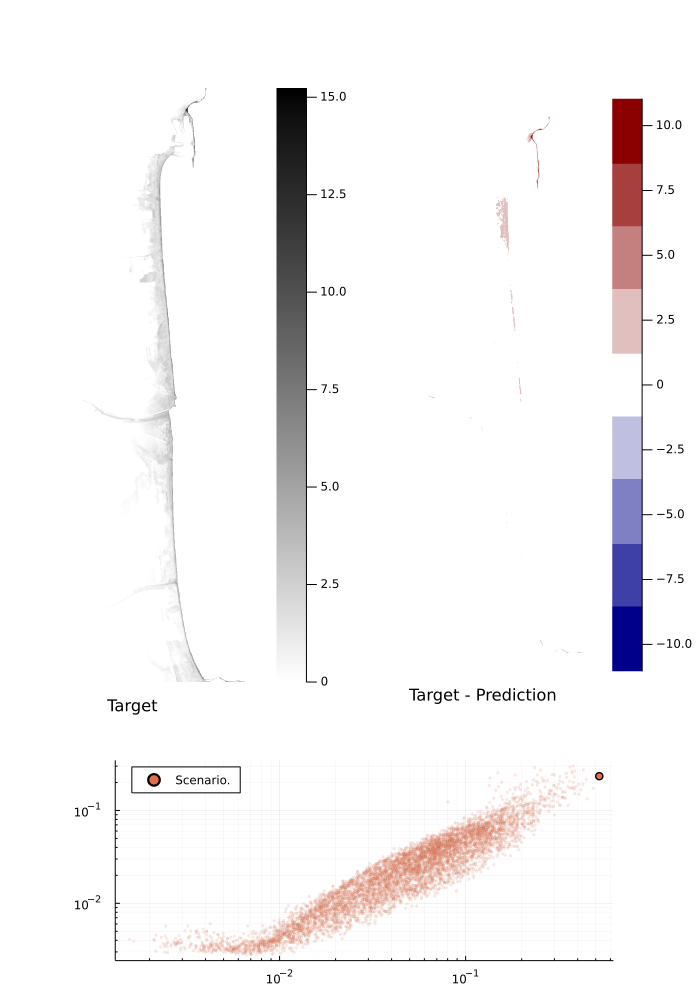

In [33]:
show_map_on_size_error(eval_df.scenario[end])

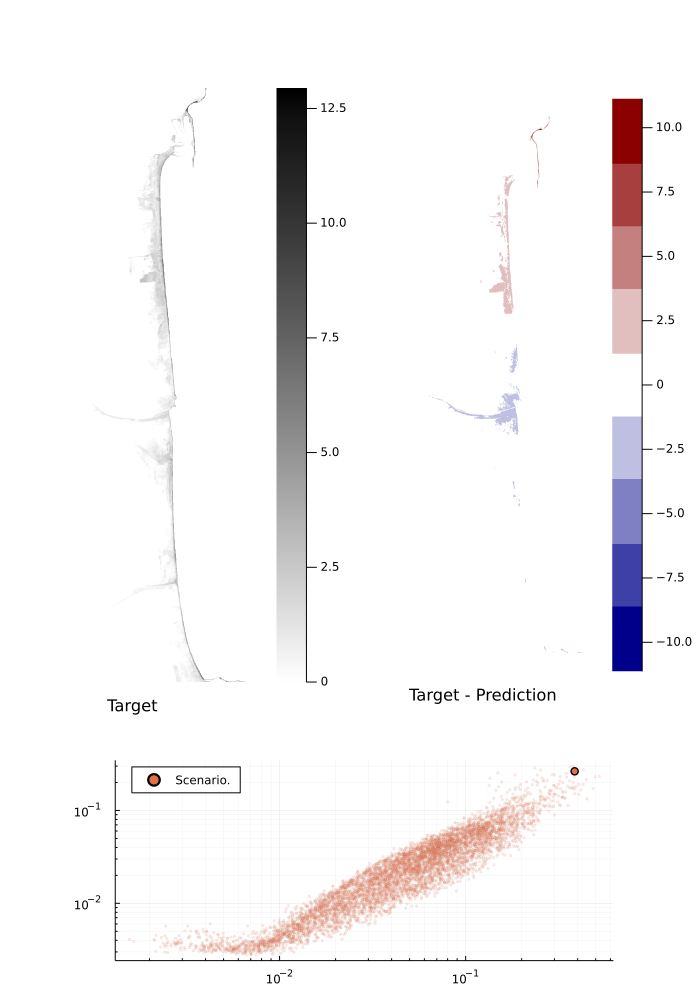

In [34]:
show_map_on_size_error(q_scenario)

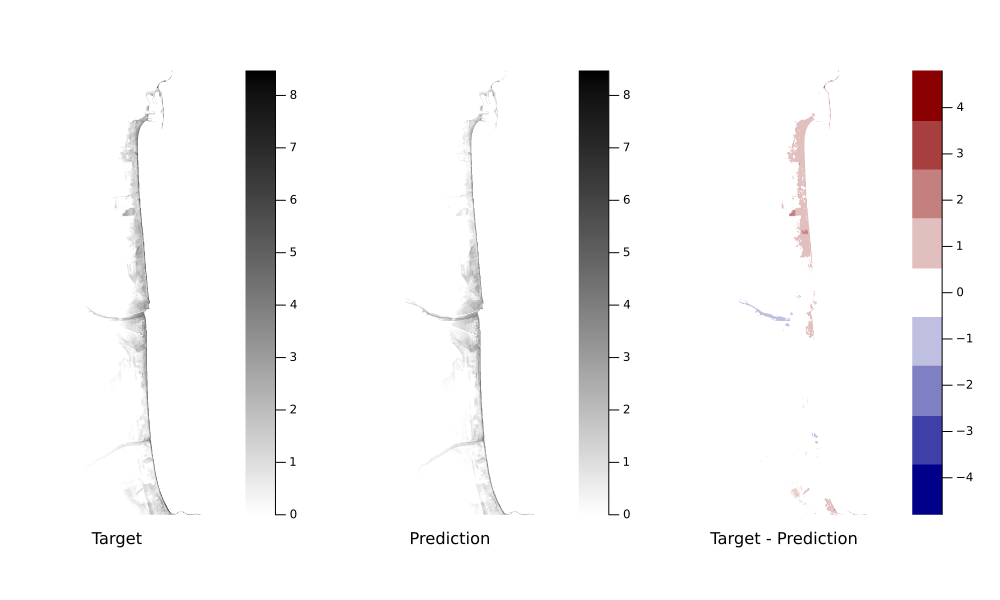

In [35]:
p = compare_maps(get_prediction(eval_df.scenario[end-1])...)
savefig(p, joinpath(eval_dir, "inundation_large_2.png"))
display(p)

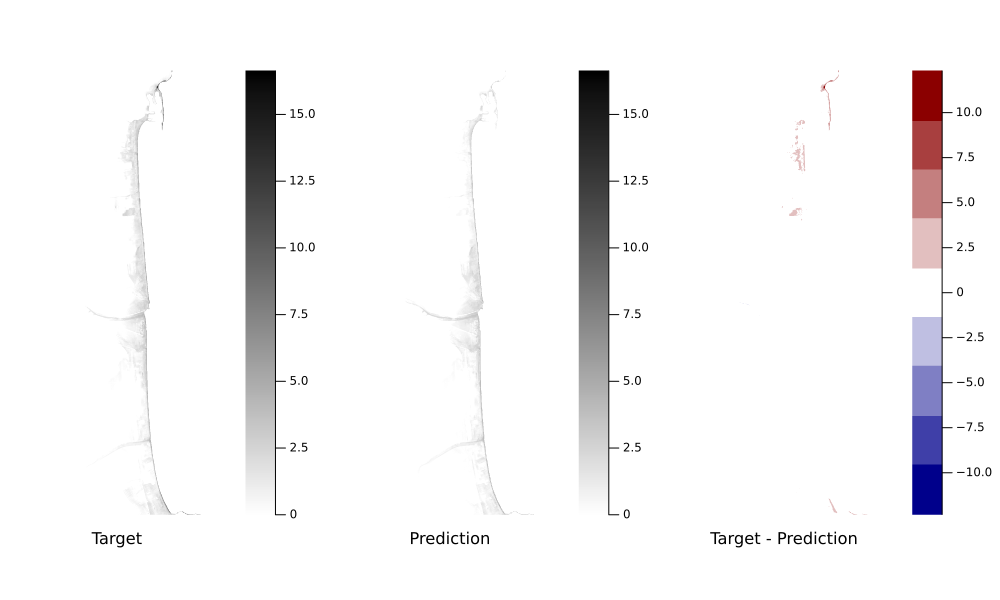

In [36]:
p = compare_maps(get_prediction(eval_df.scenario[end-2])...)
savefig(p, joinpath(eval_dir, "inundation_large_3.png"))
display(p)

# Large relative error.

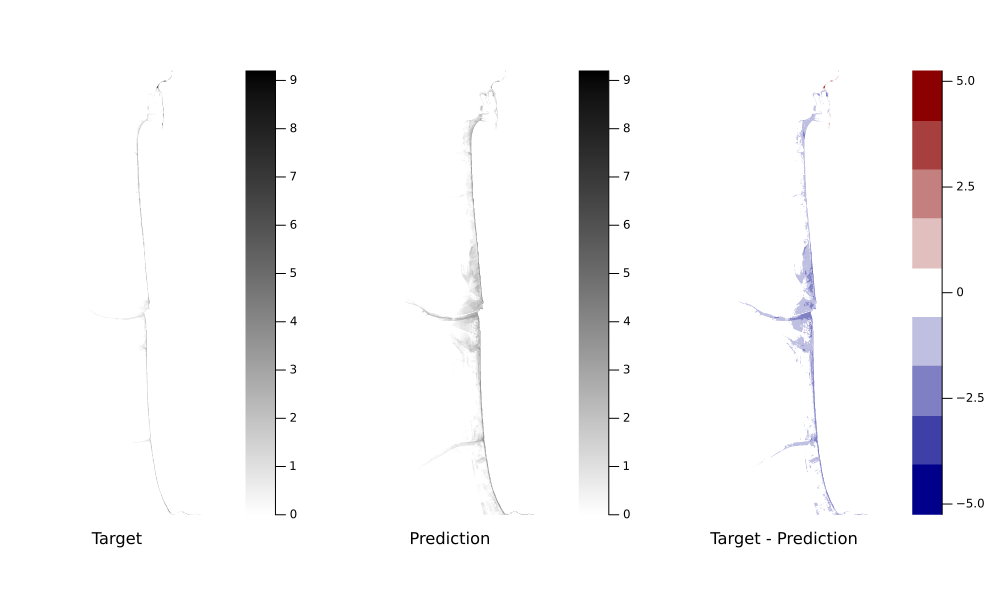

In [37]:
sort!(eval_df, [:rel_error])
p = compare_maps(get_prediction(eval_df.scenario[end])...)
savefig(p, joinpath(eval_dir, "inundation_rel_error_1.png"))
display(p)

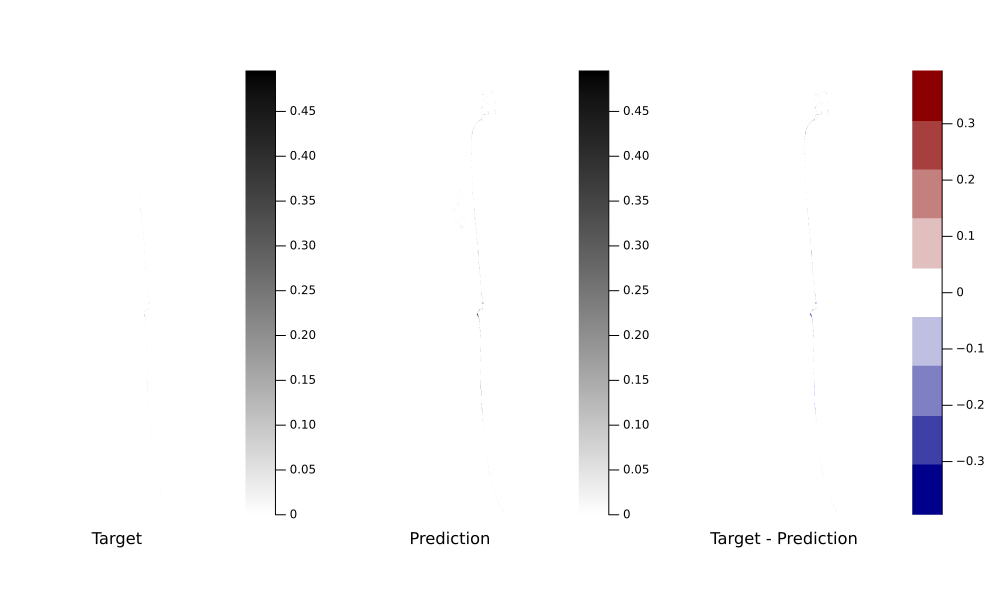

In [38]:
p = compare_maps(get_prediction(eval_df.scenario[end-1])...)
savefig(p, joinpath(eval_dir, "inundation_rel_error_2.png"))
display(p)

# Pointwise predictions.

In [39]:
poi_preds_df = CSV.File(joinpath(eval_dir, "point_predictions.txt"); delim='\t') |> DataFrame

,p1,p2,p3,p4,p5,p6,p7,p8
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,0.0,1.07032,1.33615,0.0,0.0,0.0,0.0,0.867016
2,0.0,0.0,0.15457,0.0,0.0,0.0,0.0,0.0
3,0.0,0.269099,0.542089,0.0,0.0,0.0,0.0,0.00901297
4,0.0,3.08172,3.23014,0.0,0.0,0.0,0.0,2.85412
5,0.0,0.101734,0.369107,0.0,0.0,0.0,0.0,0.0
6,0.0,0.274197,0.664152,0.0,0.0,0.0,0.0,0.071891
7,0.0,1.57177,1.87272,0.0,0.0,0.0,0.0,1.3053
8,0.0,0.0926815,0.33364,0.0,0.0,0.0,0.0,0.0
9,0.0,0.0,0.200486,0.0,0.0,0.0,0.0,0.0


In [40]:
# subset of points.
target_front_cols = [Symbol("t$i") for i in poi_df[poi_df[!, "shore-front"] .== true, :point_nr]];
pred_front_cols = [Symbol("p$i") for i in poi_df[poi_df[!, "shore-front"] .== true, :point_nr]];
target_back_cols = [Symbol("t$i") for i in poi_df[poi_df[!, "shore-back"] .== true, :point_nr]];
pred_back_cols = [Symbol("p$i") for i in poi_df[poi_df[!, "shore-back"] .== true, :point_nr]];

### Comparisson of covariance structure.

Below are som plots of the estimated covariance of the inundation height at the specific points.

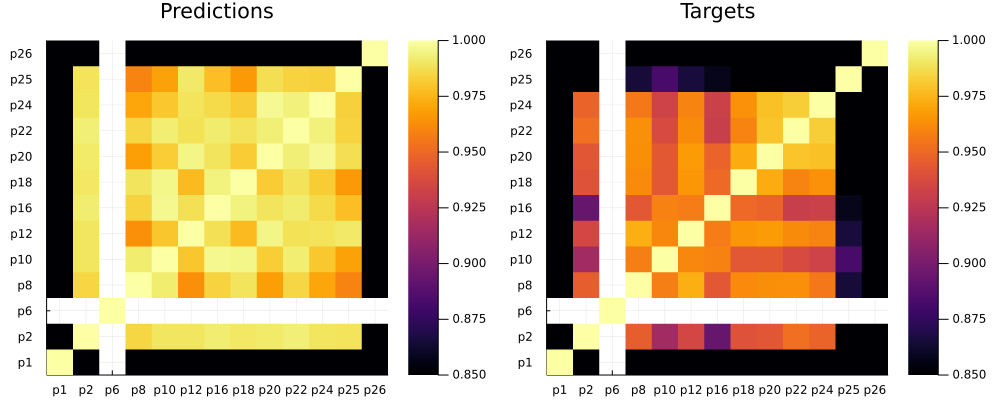

In [41]:
# Along the shoreline front
theme(:default)
clim = (0.85, 1)
p1 = heatmap(
    cor(Matrix(poi_preds_df[!, pred_front_cols]));
    xticks=(1:length(pred_front_cols), pred_front_cols),
    yticks=(1:length(pred_front_cols), pred_front_cols),
    clim = clim,
    top_margin=5mm
)
# Unnormalized covariance matrix
p2 = heatmap(
    cor(Matrix(poi_preds_df[!, target_front_cols]));
    xticks=(1:length(pred_front_cols), pred_front_cols),
    yticks=(1:length(pred_front_cols), pred_front_cols),
    clim = clim,
    top_margin = 5mm
)

p = plot(p1, p2, layout = (1,2), size=(1000,400), title=["Predictions" "Targets"])
savefig(p, joinpath(eval_dir, "corelations_front.png"))
display(p)

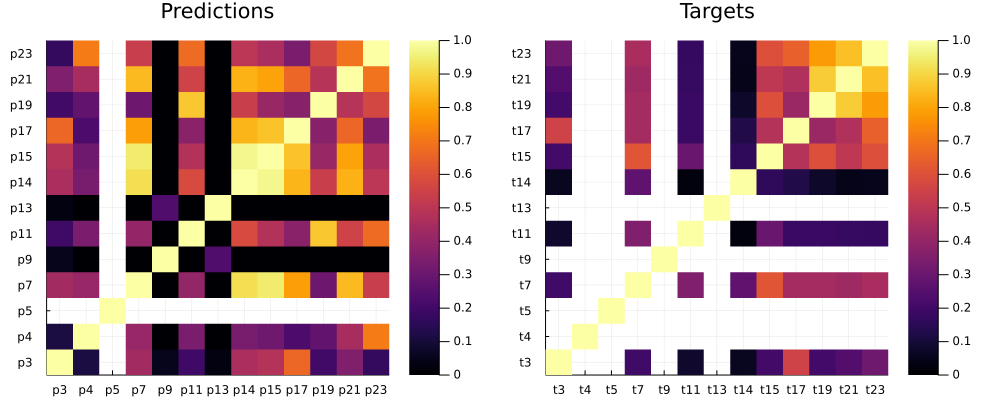

In [42]:
# Along the shoreline back
clim = (0.,1.)

p1 = heatmap(
    cor(Matrix(poi_preds_df[!, pred_back_cols]));
    xticks=(1:length(pred_back_cols), pred_back_cols),
    yticks=(1:length(pred_back_cols), pred_back_cols),
    clim = clim,
    top_margin=5mm
)
# Unnormalized covariance matrix
p2 = heatmap(
    cor(Matrix(poi_preds_df[!, target_back_cols]));
    xticks=(1:length(pred_back_cols), target_back_cols),
    yticks=(1:length(pred_back_cols), target_back_cols),
    clim = clim,
    top_margin=5mm
)

p = plot(p1, p2, layout = (1,2), size=(1000,400), title=["Predictions" "Targets"])
savefig(p, joinpath(eval_dir, "corelations_back.png"))
display(p)

Note the huge difference in correlation structure! Note also that the predictions are in general more correlated than the targets, except for certain extreme points.

### Quality of pointwise predictions.

In [43]:
function r2(predictions, targets)
    residual_sum_of_squares = sum((targets .- predictions).^2)
    total_sum_of_squares = sum((targets .- mean(targets)).^2)
    1 - residual_sum_of_squares/total_sum_of_squares
end

r2 (generic function with 1 method)

In [44]:
poi_preds_df

,p1,p2,p3,p4,p5,p6,p7,p8
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,0.0,1.07032,1.33615,0.0,0.0,0.0,0.0,0.867016
2,0.0,0.0,0.15457,0.0,0.0,0.0,0.0,0.0
3,0.0,0.269099,0.542089,0.0,0.0,0.0,0.0,0.00901297
4,0.0,3.08172,3.23014,0.0,0.0,0.0,0.0,2.85412
5,0.0,0.101734,0.369107,0.0,0.0,0.0,0.0,0.0
6,0.0,0.274197,0.664152,0.0,0.0,0.0,0.0,0.071891
7,0.0,1.57177,1.87272,0.0,0.0,0.0,0.0,1.3053
8,0.0,0.0926815,0.33364,0.0,0.0,0.0,0.0,0.0
9,0.0,0.0,0.200486,0.0,0.0,0.0,0.0,0.0


In [45]:
poi_df

,point_nr,row,col,shore-front,shore-back
,Int64,Int64,Int64,Int64,Int64
1,1,840,1,1,0
2,2,880,1,1,0
3,3,496,208,0,1
4,4,556,208,0,1
5,5,616,208,0,1
6,6,652,207,1,0
7,7,588,408,0,1
8,8,625,408,1,0
9,9,572,608,0,1


In [46]:
stats_df = DataFrame()

function class(row)
    if row."shore-front" == 1
        return "Front"
    elseif row."shore-back" == 1
        return "Back"
    else
        return "None"
    end
end

for row in eachrow(poi_df)
    pred, target = Symbol("p$(row.point_nr)"), Symbol("t$(row.point_nr)")
    push!(stats_df,
        (point = pred,
        correlation = cor(poi_preds_df[!, pred], poi_preds_df[!, target]),
        r2 = r2(poi_preds_df[!, pred], poi_preds_df[!, target]),
        shore_front = row."shore-front",
        shore_back = row."shore-back",
        class = class(row))
    )
end 


In [47]:
sort!(stats_df, [:r2])

,point,correlation,r2,shore_front,shore_back,class
,Symbol,Float64,Float64,Int64,Int64,String
1,p4,NaN,-Inf,0,1,Back
2,p9,NaN,-Inf,0,1,Back
3,p13,NaN,-Inf,0,1,Back
4,p14,0.0524907,-10082.7,0,1,Back
5,p7,0.358812,-19.9872,0,1,Back
6,p11,0.118617,-9.98479,0,1,Back
7,p15,0.461906,-3.53999,0,1,Back
8,p19,0.212099,-0.155364,0,1,Back
9,p21,0.414165,-0.057219,0,1,Back


In [48]:
CSV.write(joinpath(eval_dir, "r2_poi.csv"), stats_df)

"evaluation/BS_events/r2_poi.csv"

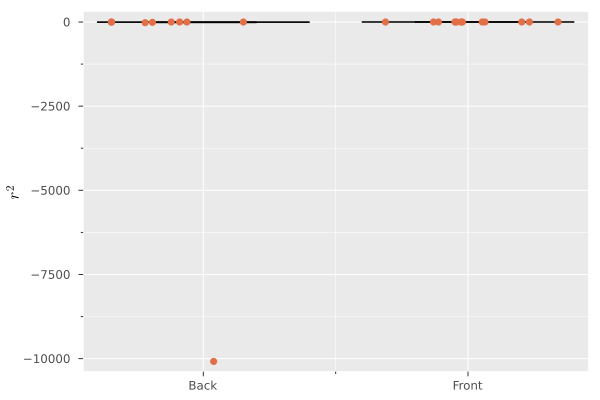

In [49]:
theme(:ggplot2)
stats_df_stacked = stack(stats_df[3:end,[:class, :r2]])

p = @df stats_df_stacked[.!(isinf.(stats_df_stacked.value) .| isnan.(stats_df_stacked.value)),:] boxplot(
    :class, 
    :value, 
    legend=:bottomright,
    label = "",
    ylabel = "\$r^2\$",
    outliers = :false
)

@df stats_df_stacked[.!(isinf.(stats_df_stacked.value) .| isnan.(stats_df_stacked.value)),:] dotplot!(
    p,
    :class, 
    :value, 
    legend=:bottomright,
    label = ""
)

savefig(p, joinpath(eval_dir, "r2_front_back.png"))
display(p)

In [50]:
function make_scatter_plots(stats_df, ticks, lim, rotation = 0.)
    scatter_plots = []
    for row in eachrow(stats_df)
        point = string(row.point)[2:end]
        p = scatter(
                poi_preds_df[!,"p"*point],
                poi_preds_df[!,"t"*point],
                alpha=0.2, 
                xlabel="prediction", 
                ylabel="target", 
                legend=false,
                margins=2mm,
                title="p: "*point,
                xticks = ticks,
                yticks = ticks,
                xlims = (0,lim),
                ylims = (0,lim),
                aspect_ratio = 1.,
                xrotation=rotation,
                markercolor=:black
            )
        plot!(p, [0,lim],[0,lim], linestyle=:dash, linewidth=3, linecolor=:grey, label="")
        push!(scatter_plots, p)
    end
    return scatter_plots
end

make_scatter_plots (generic function with 2 methods)

In [51]:
scatter_front_plots = make_scatter_plots(stats_df[stats_df.shore_front .== 1,:], 0:1:10, 10);
scatter_back_plots = make_scatter_plots(stats_df[stats_df.shore_back .== 1,:], 0:0.5:4, 4, 45);

In [52]:
theme(:ggplot2)
layout = (ceil(Int16, length(scatter_front_plots)/3),3)
p = plot(scatter_front_plots..., layout=layout, legend=false, size=(900,1500))
savefig(p, joinpath(eval_dir, "scatter_front.png"))
#display(p)

In [53]:
layout = (ceil(Int16, length(scatter_back_plots)/3),3)
p = plot(scatter_back_plots..., layout=layout, legend=false, size=(900,1500))
savefig(p, joinpath(eval_dir, "scatter_back.png"))
#display(p)

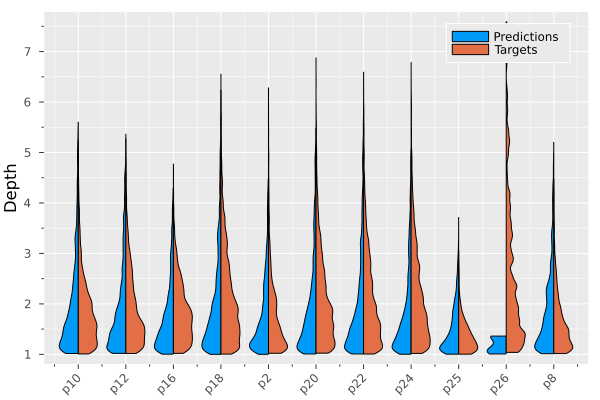

In [54]:
preds_df = poi_preds_df[:, pred_front_cols];
targets_df = poi_preds_df[:, target_front_cols];

rename!(preds_df, pred_front_cols);
rename!(targets_df, pred_front_cols);

preds_df_stacked = stack(preds_df)
targets_df_stacked = stack(targets_df)

@df preds_df_stacked[preds_df_stacked.value .> 1.,:] violin(:variable, :value, label="Predictions", side=:left, xrotation=45, ylabel="Depth")
@df targets_df_stacked[targets_df_stacked.value .> 1.,:] violin!(:variable, :value, label="Targets", side=:right)

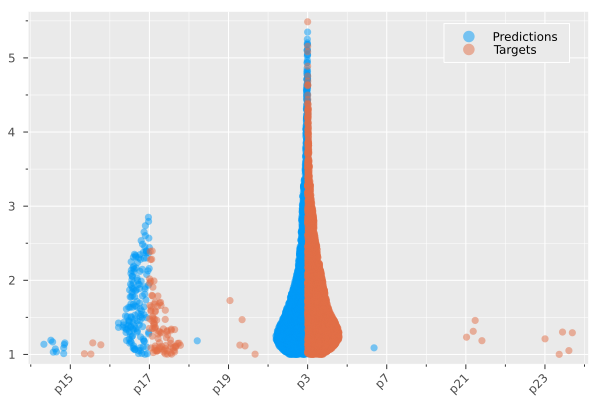

In [55]:
preds_df = poi_preds_df[:, pred_back_cols];
target_df = poi_preds_df[:, target_back_cols];

rename!(preds_df, pred_back_cols);
rename!(target_df, pred_back_cols);

preds_df_stacked = stack(preds_df)
target_df_stacked = stack(target_df)

@df preds_df_stacked[preds_df_stacked.value .> 1.,:] dotplot(:variable, :value, label="Predictions", alpha=0.5, side=:left, xrotation=45)
@df target_df_stacked[target_df_stacked.value .> 1.,:] dotplot!(:variable, :value, label="Targets", alpha=0.5, side=:right)

# Accuracy metrics

Let $P_i, S_i$ be the predicted and the simulated flow-depth at locations $1 \leq i \leq N$. Let $K_i = S_i/P_i$. Aida measured the accuracy in terms of a geometric mean ratio $K$ given by

$$
    \log(K) = \frac{1}{N} \sum_{i=1}^N \log\left(K_i\right).
$$

Note that $K$ may be considered as a kind of correction factor. 
Its standard deviation 

$$
    \log(\kappa) = \left(\frac{1}{N}\sum_{i=1}^N\left[\left(\log(S_i/P_i)\right)^2 - \left(\log(K)\right)^2\right]\right)^{1/2}
$$

is a measure of the fluctuation of this correction factor.
Note that it is only defined for positive numbers, and so it is not suitable at the boundary of the inundation area, when measuring flow-depth.

Another measure applied in \cite{muliaMachineLearningbasedTsunami2022} is the goodness-of-fit $G$ defined by  

\begin{equation}
    \sum_{i=1}^N w_i^2S_iP_i = \frac{1-G}{2}\left(\sum_{i=1}^N w_i^2O_i^2 + \sum_{i=1}^N w_i^2P_i^2\right).
\end{equation}

where $w_i$ are some nonnegative weights. It follows from H\"older's and Young's inequality that $0 \leq G \leq 1$ where $G = 0$ only if predictions and simulations are equal. 

In [56]:
aida_df = CSV.File(joinpath(eval_dir, "summary_by_class.txt"); delim='\t', missingstring="missing") |> DataFrame;

In [57]:
names(aida_df)

9-element Vector{String}:
 "scenario"
 "class"
 "K"
 "kappa"
 "nr_of_samples_aida"
 "mean_res"
 "std_res"
 "q_res"
 "nr_of_samples_res"

In [ ]:
p = @df aida_df[aida_df.nr_of_samples_aida .> 100 .&& aida_df.class .> 1,:] boxplot(
    string.(:class), 
    :K, label="", 
    xlabel = "Depth class", 
    ylabel = "K", 
    yaxis=:identity, 
    outliers=:false
)
plot!(p, [0,3],[1,1], linestyle=:dash, linewidth=3, linecolor=:grey, label="")

savefig(p, joinpath(eval_dir, "aida_K_box.png"))
display(p)
#@df aida_df[.!isnan.(aida_df.K),:] boxplot(string.(aida_class[:class]), :K, label="")

In [ ]:
p = @df aida_df[aida_df.nr_of_samples_aida .> 100 .&& aida_df.class .> 1,:] boxplot(
    string.(:class), 
    :kappa, label="", 
    xlabel="Depth class", 
    ylabel="\$\\kappa\$", 
    outliers=:false
)
savefig(p, joinpath(eval_dir, "aida_kappa_box.png"))
display(p)

In [ ]:
p = @df aida_df[aida_df.nr_of_samples_res .> 100,:] boxplot(
    string.(:class), 
    :mean_res, 
    label="", 
    xlabel = "Depth class", 
    ylabel = "mean residual", 
    yaxis=:identity, 
    outliers=:false
)
plot!(p, [0,4],[0,0], linestyle=:dash, linewidth=3, linecolor=:grey, label="")

savefig(p, joinpath(eval_dir, "mean_residuals.png"))
display(p)

In [ ]:
p = @df aida_df[aida_df.nr_of_samples_res .> 100,:] boxplot(
    string.(:class), 
    :q_res, 
    label="", 
    xlabel = "Depth class", 
    ylabel = "\$Q_{|r|}(0.95)\$", 
    yaxis=:identity,
    outliers=:false
)

savefig(p, joinpath(eval_dir, "q_residuals.png"))
display(p)

In [ ]:
p = @df aida_df[aida_df.nr_of_samples_res .> 100,:] boxplot(
    string.(:class), 
    :std_res, 
    label="", 
    xlabel = "Depth class", 
    ylabel = "\$\\sigma_r\$", 
    yaxis=:identity,
    outliers=:false
)

savefig(p, joinpath(eval_dir, "std_residuals.png"))
display(p)

To save the notebook for later use:
```terminal
jupyter nbconvert --to html evaluate-model.ipynb --output-dir [Folder] --out [filename without extension]
```